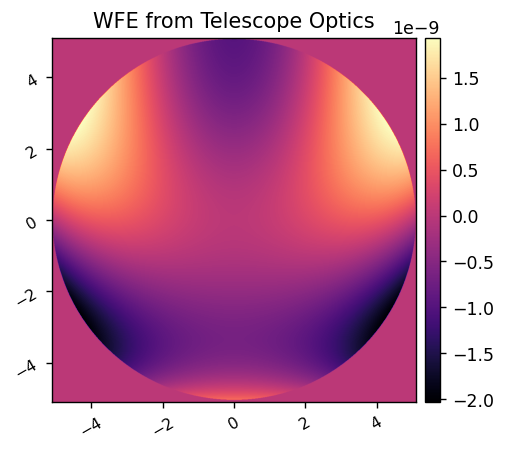

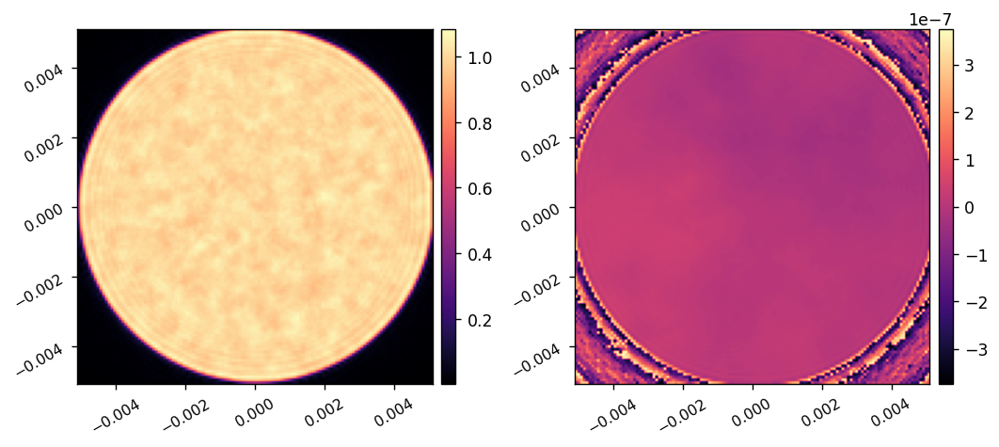

In [1]:
import numpy as np
import cupy as cp
import astropy.units as u
from astropy.io import fits

from matplotlib.patches import Rectangle, Circle
from pathlib import Path
from IPython.display import clear_output
import time
from importlib import reload

import poppy

import logging, sys
poppy_log = logging.getLogger('poppy')
poppy_log.setLevel('DEBUG')
logging.basicConfig(stream=sys.stdout, level=logging.INFO)
poppy_log.disabled = True

import warnings
warnings.filterwarnings("ignore")

from prop_models import full, compact, agpm
reload(full)
reload(compact)
reload(agpm)

from wfsc_1dm import efc, pwp, utils

import misc_funs as misc

pupil_diam = 10.2*u.mm
wavelength_c = 750e-9*u.m

vortex = agpm.IdealAGPM(name='VVC', wavelength=wavelength_c, charge=6)

lyot_stop_physical = poppy.CircularAperture(name='Lyot Stop', radius=3*u.mm)
lyot_stop_compact = poppy.CircularAperture(name='Lyot Stop', radius=3*u.mm * 500/350)

hdr = fits.getheader('wfe_on_axis.fits')
ote_wfe = poppy.FITSOpticalElement(opd='wfe_on_axis.fits', opdunits='meters',
                                   pixelscale=pupil_diam.to_value(u.m)/hdr['NAXIS1'])
misc.imshow1(ote_wfe.opd, 'WFE from Telescope Optics', pxscl=ote_wfe.pixelscale.to(u.mm/u.pix))


wfe = fits.getdata('pupil-data/post_fpm_pupil_wfe.fits')
wfe_pxscl = fits.getheader('pupil-data/post_fpm_pupil_wfe.fits')['PIXELSCL'] * u.m/u.pix
wfe = poppy.ArrayOpticalElement(transmission=wfe[0], 
                                opd=wfe[1]*wavelength_c.to_value(u.m)/(2*np.pi),
                                pixelscale=wfe_pxscl,
                               )

misc.imshow2(wfe.amplitude, wfe.opd, pxscl=wfe.pixelscale)

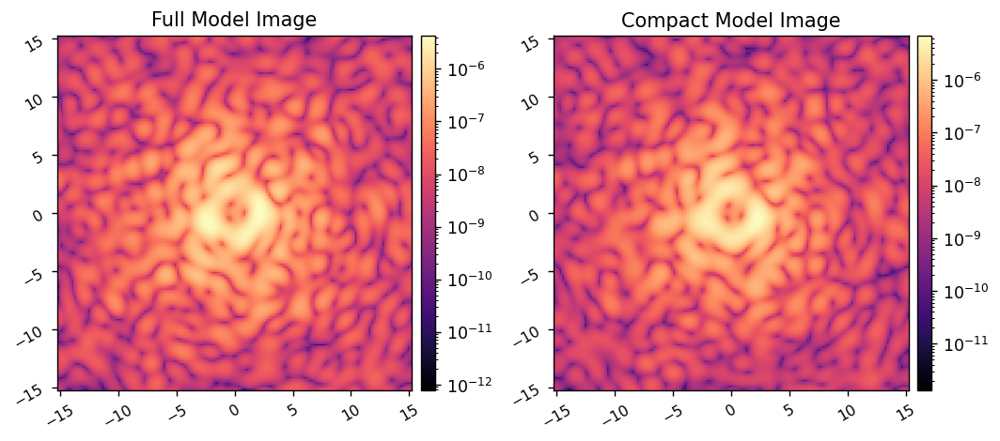

In [2]:
reload(full)
reload(compact)

reload(agpm)
vortexf = agpm.IdealAGPM(name='VVC', wavelength=wavelength_c, charge=6)
vortexc = agpm.IdealAGPM(name='VVC', wavelength=wavelength_c, charge=6)

fc = full.CORO()

fc.npix = 128
fc.oversample = 16
fc.npsf = 128

fc.use_opds = True
fc.OTEWFE = ote_wfe
fc.FPM = vortexf
fc.LYOT = lyot_stop_physical

cc = compact.CORO()

cc.npix = 128
cc.oversample = 16
cc.npsf = 128

cc.RETRIEVED = wfe 
cc.FPM = vortexc
cc.LYOT = lyot_stop_compact

im_full = fc.snap()

im_comp = cc.snap()

misc.imshow2(im_full, im_comp, 'Full Model Image', 'Compact Model Image', lognorm=True,
             pxscl1=fc.psf_pixelscale_lamD, pxscl2=cc.psf_pixelscale_lamD)

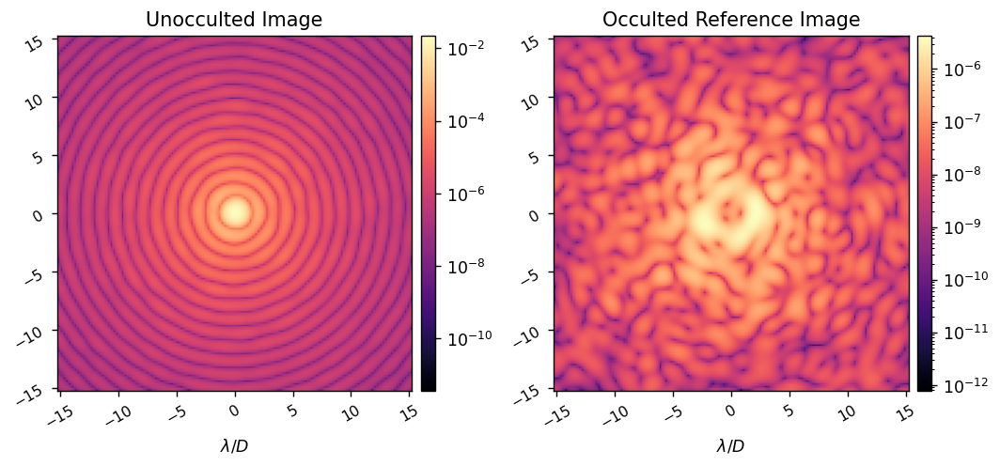

In [3]:
reload(full)

fc.FPM = None
ref_im_unocc = fc.snap()

fc.FPM = vortexf
ref_im = fc.snap()

misc.imshow2(ref_im_unocc, ref_im, 'Unocculted Image', 'Occulted Reference Image',
             lognorm=True,
             pxscl=fc.psf_pixelscale_lamD, xlabel='$\lambda/D$')

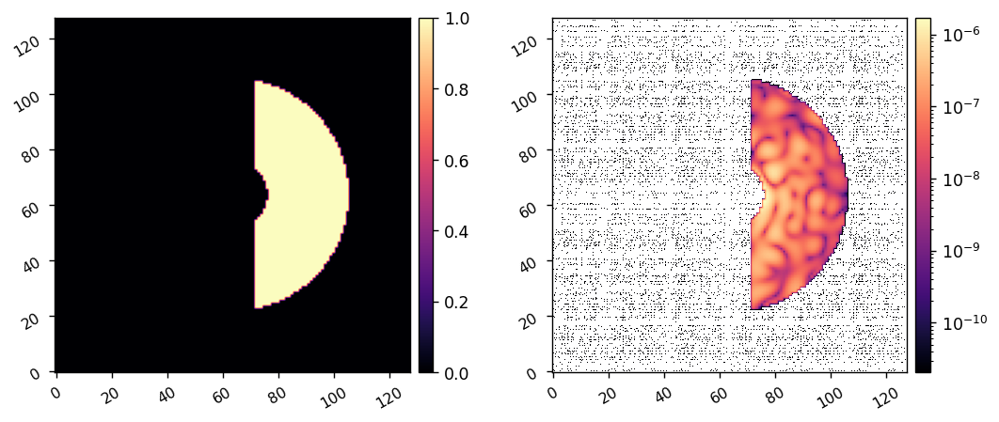

Saved data to:  masks\dark_mask.fits


In [4]:
reload(utils)
npsf = cc.npsf
nact = cc.Nact

xfp = (np.linspace(-npsf/2, npsf/2-1, npsf) + 1/2)*cc.psf_pixelscale_lamD
fpx,fpy = np.meshgrid(xfp,xfp)

edge = 2
iwa = 3
owa = 10
rot = 0

# Create the mask that is used to select which region to make dark.
dark_params = {
    'inner_radius' : iwa,
    'outer_radius' : owa,
    'edge_position' : edge,
    'direction' : '+x',
    'rotation':rot,
    'full': False
}
dark_mask = utils.create_annular_focal_plane_mask(fpx, fpy, dark_params)
misc.imshow2(dark_mask, dark_mask*ref_im, lognorm2=True)

misc.save_fits('masks\dark_mask.fits', dark_mask.astype(np.int32))

Generating probe with amplitude=5.000e-08, radius=14.0, phase=0.000, offset=(0.0,0.0), with discontinuity along x axis.
Generating probe with amplitude=5.000e-08, radius=14.0, phase=1.571, offset=(0.0,0.0), with discontinuity along y axis.


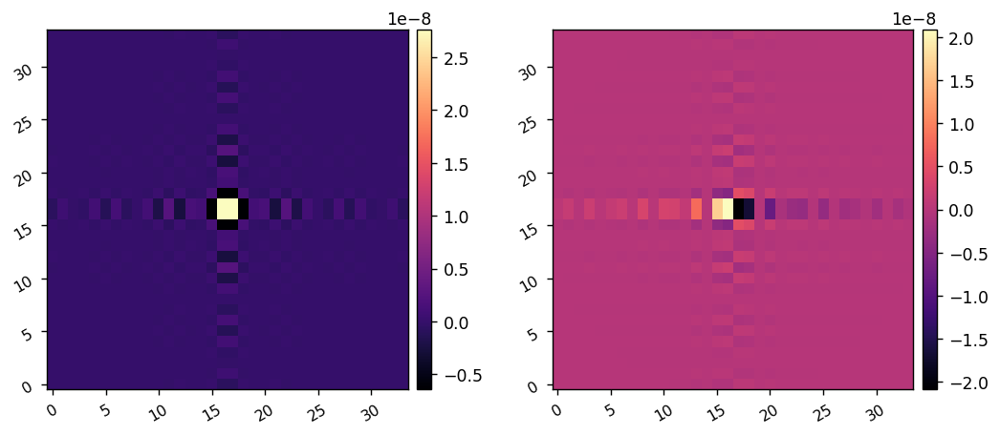

In [5]:
Npairs = 2

probe_amp = 5e-8
probe_radius = 14
probe_offset = (0,0)

probes = pwp.create_sinc_probes(Npairs, fc.Nact, fc.dm_mask, probe_amp, probe_radius, probe_offset, display=True)

pwp_fun = pwp.run_pwp_bp

reg_fun = utils.beta_reg
reg_conds = np.array([[0],
                      [-2]])

In [6]:
commands

NameError: name 'commands' is not defined

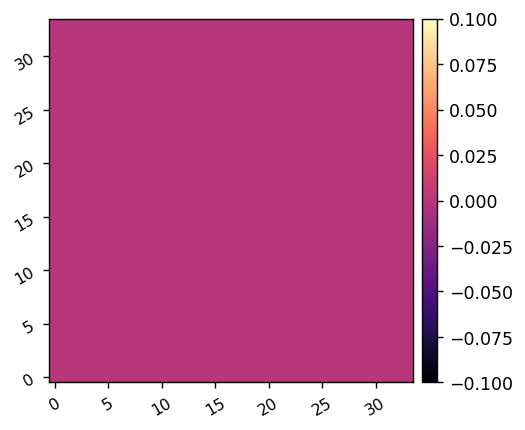

In [12]:
misc.imshow1(fc.get_dm())

Building Jacobian
Jacobian built in 156.882 sec
Jacobian (re)built in 156.890s.


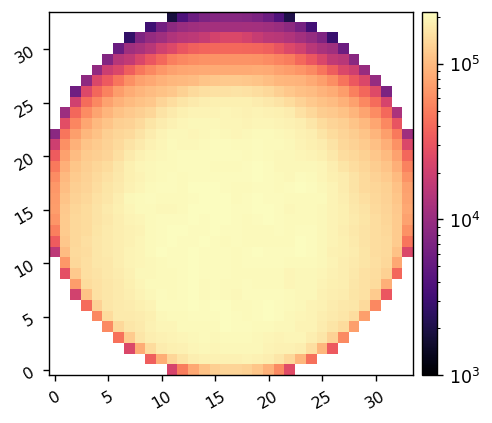

Beginning closed-loop EFC simulation.
Max singular value squared:	 285240371966.18756
alpha^2:			 46215928553.055916
	Running iteration 0/10.
	Computing EFC matrix via beta_reg with condition value -2.00e+00
Estimation and exact image match factor is 1.046


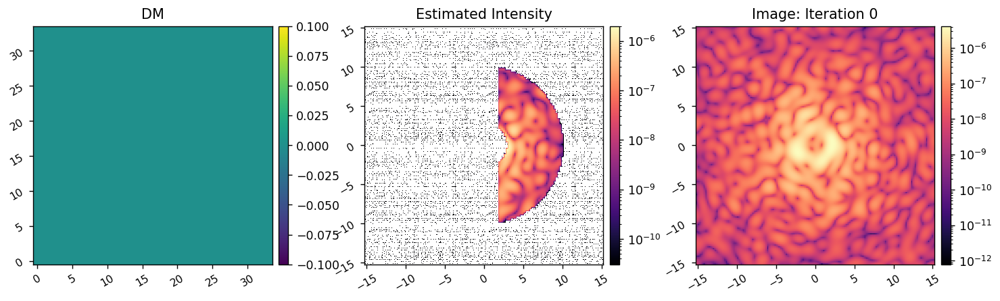

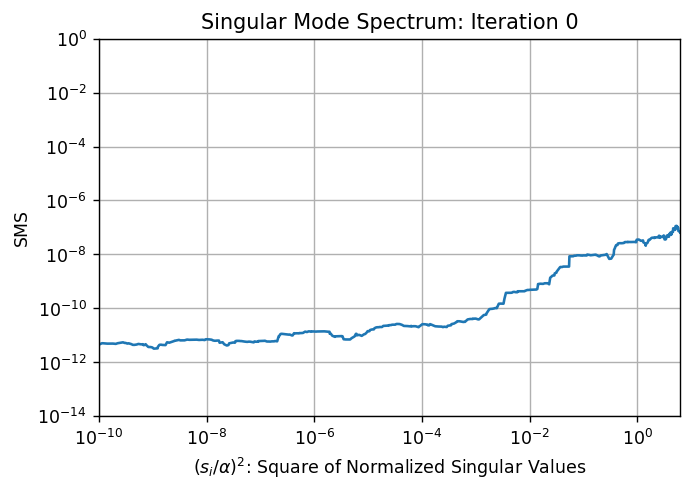

	Running iteration 1/10.
Estimation and exact image match factor is 1.043


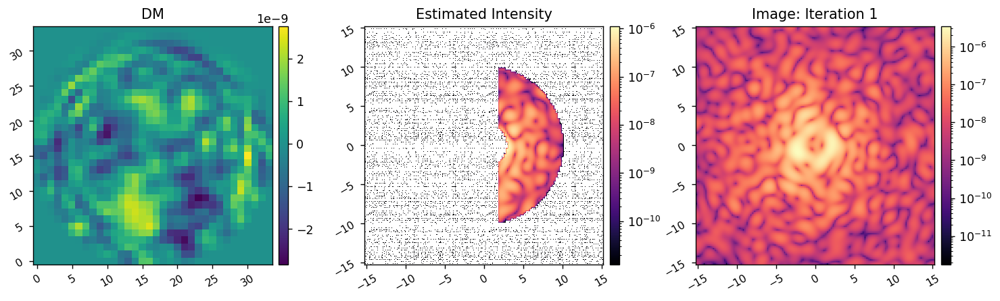

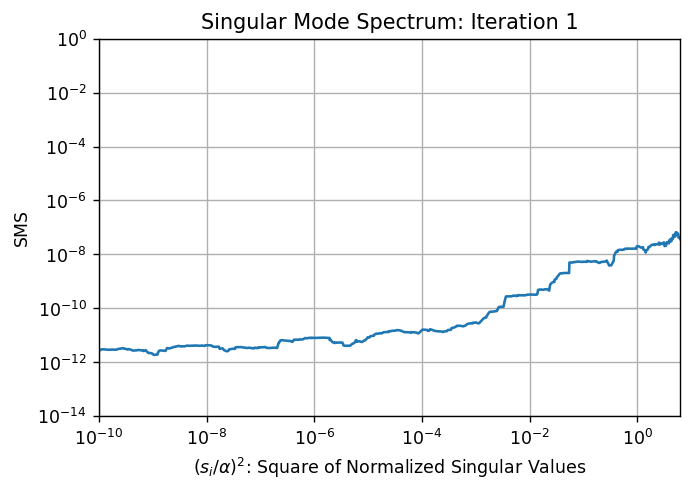

	Running iteration 2/10.
Estimation and exact image match factor is 1.039


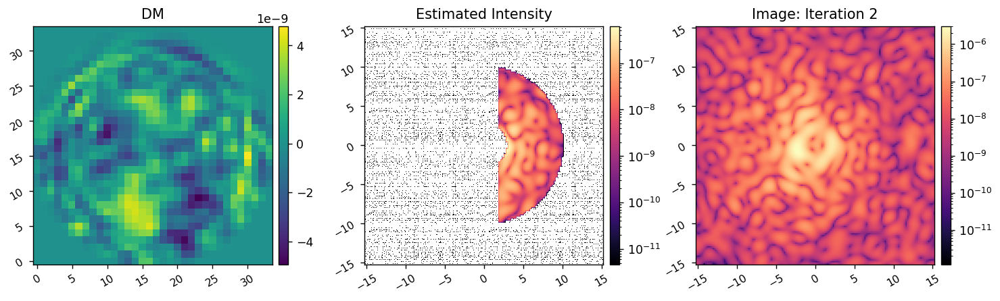

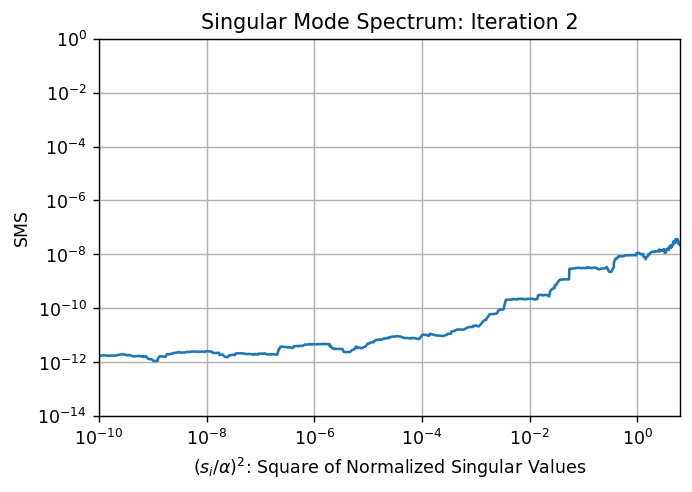

	Running iteration 3/10.
Estimation and exact image match factor is 1.035


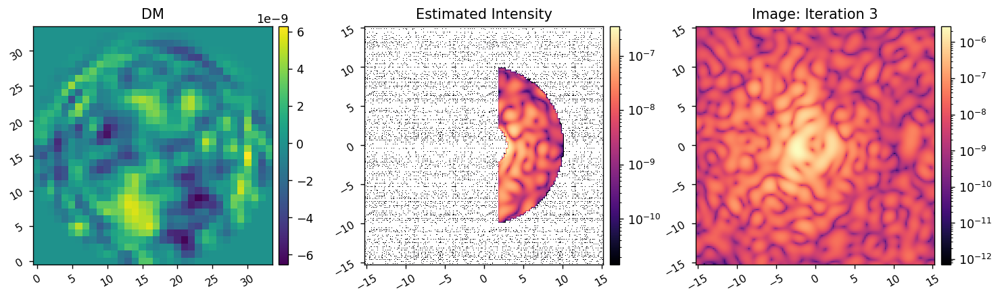

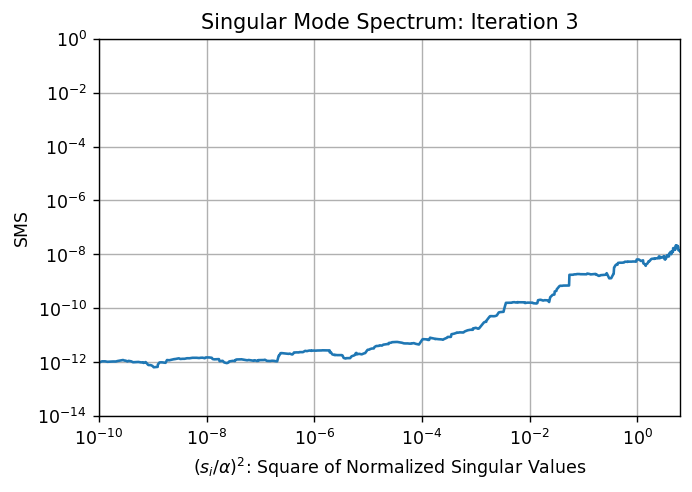

	Running iteration 4/10.
Estimation and exact image match factor is 1.028


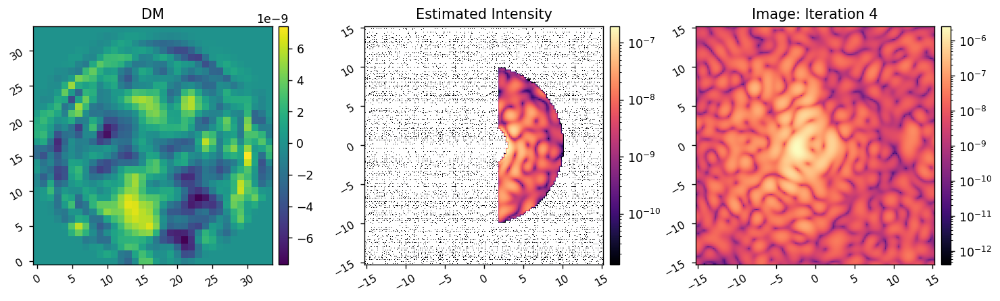

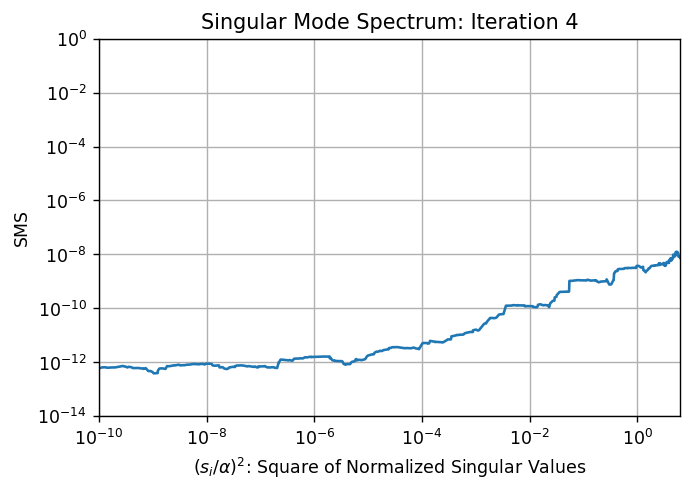

	Running iteration 5/10.
Estimation and exact image match factor is 1.019


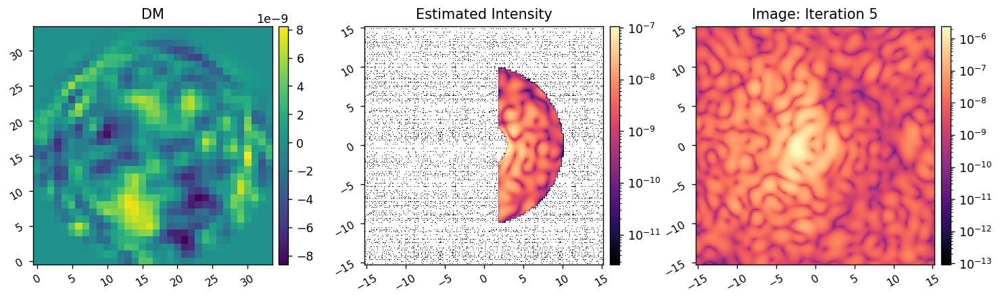

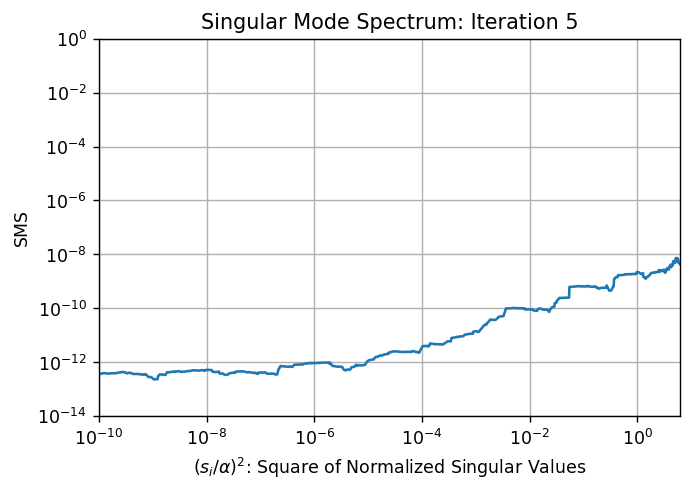

	Running iteration 6/10.
Estimation and exact image match factor is 1.005


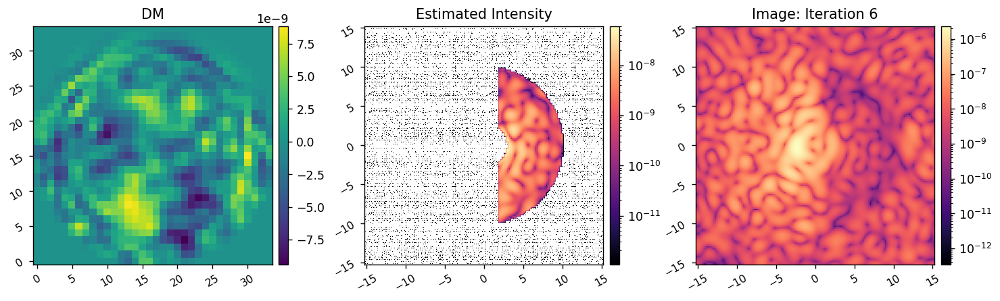

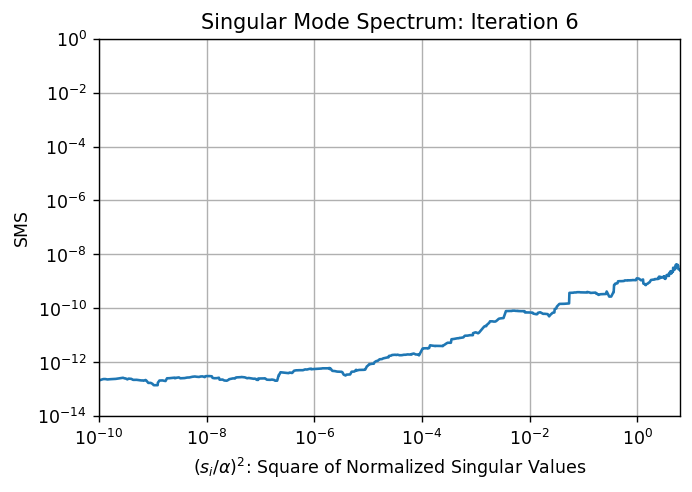

	Running iteration 7/10.
Estimation and exact image match factor is 0.983


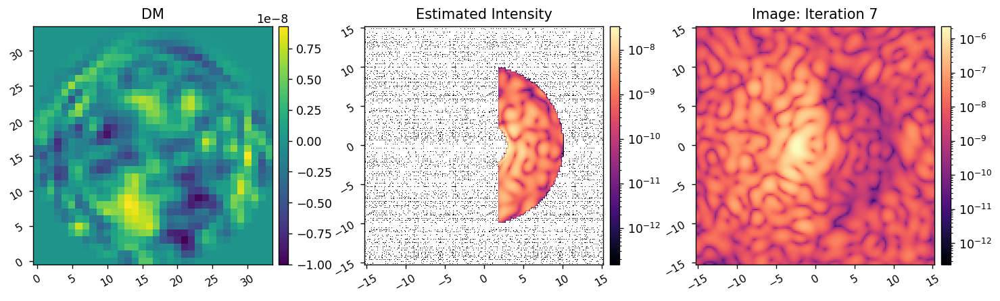

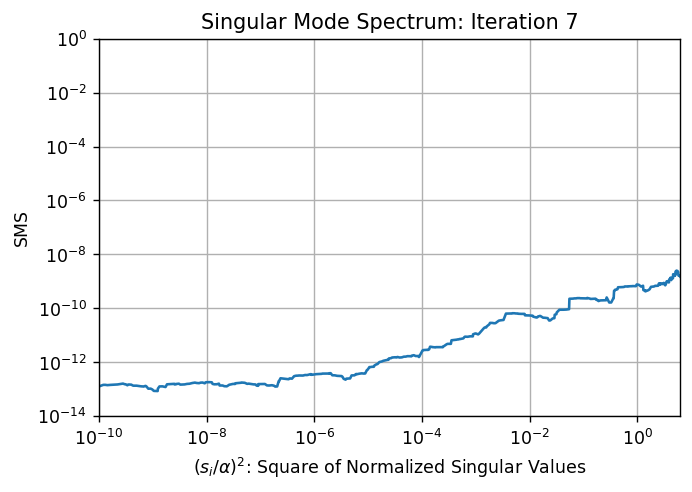

	Running iteration 8/10.
Estimation and exact image match factor is 0.950


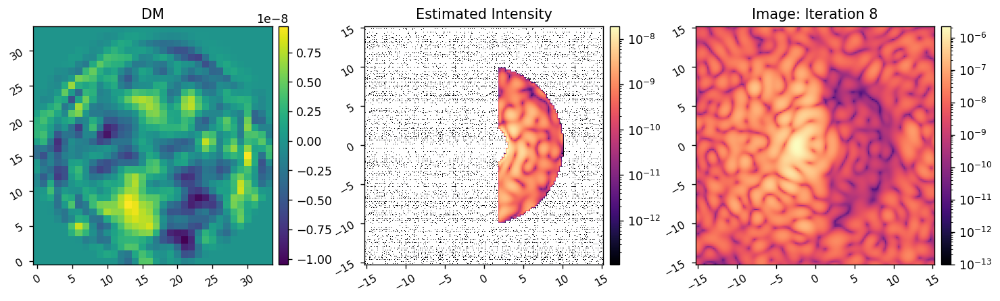

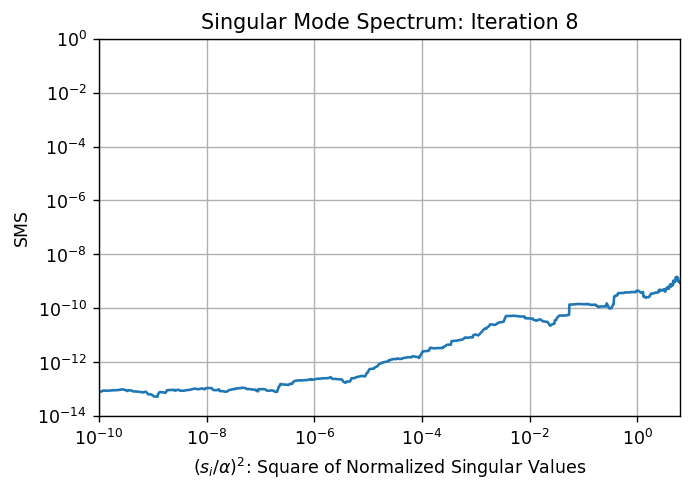

	Running iteration 9/10.
Estimation and exact image match factor is 0.900


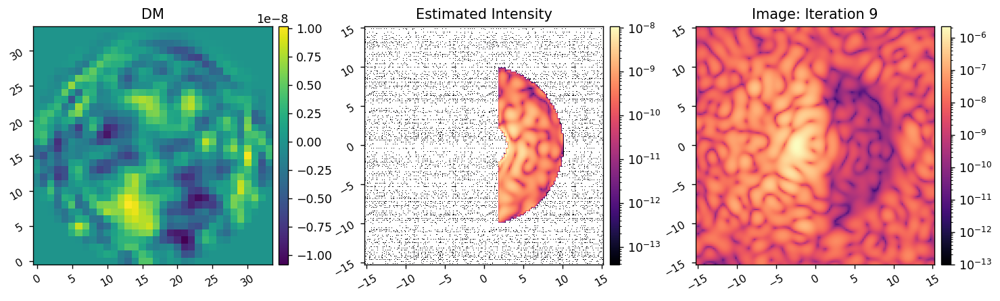

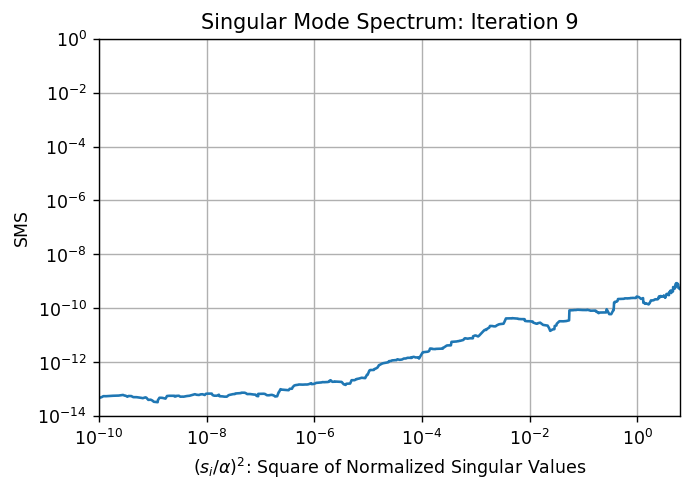

	Running iteration 10/10.
Estimation and exact image match factor is 0.829


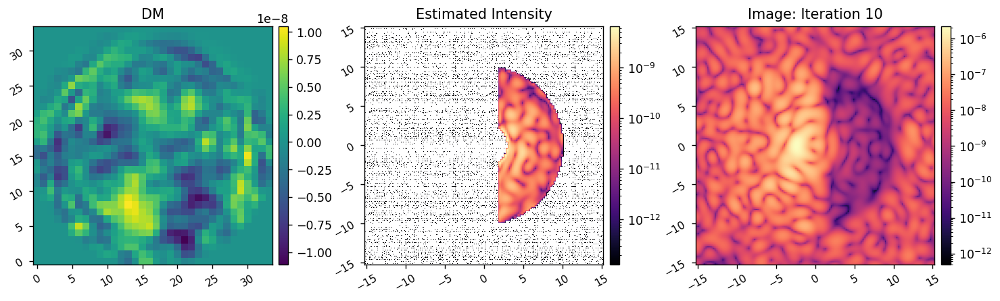

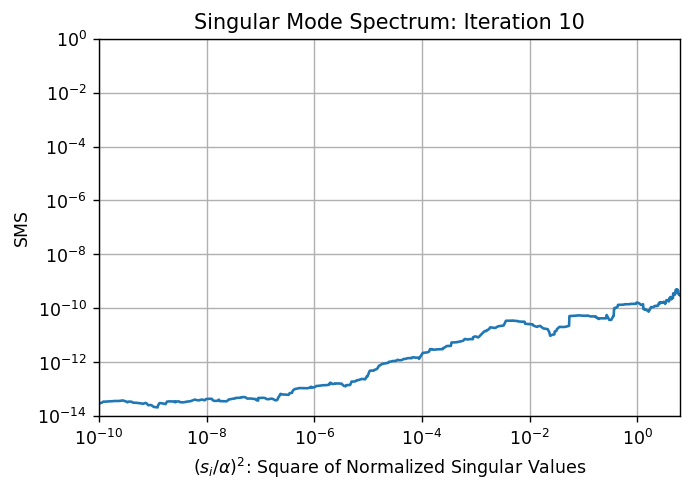

EFC completed in 40.234 sec.
Building Jacobian
Jacobian built in 157.152 sec
Jacobian (re)built in 157.159s.


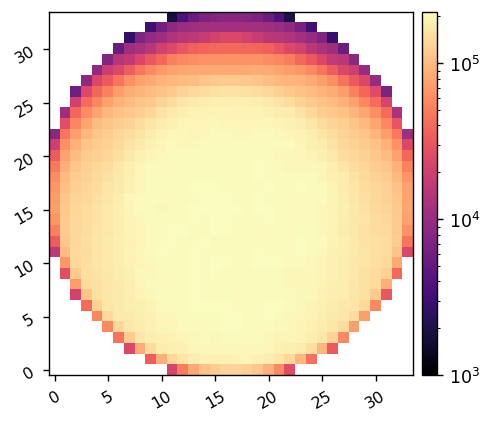

Beginning closed-loop EFC simulation.
Max singular value squared:	 284195579720.6028
alpha^2:			 45961155811.35885
	Running iteration 0/10.
	Computing EFC matrix via beta_reg with condition value -2.00e+00
Estimation and exact image match factor is 0.834


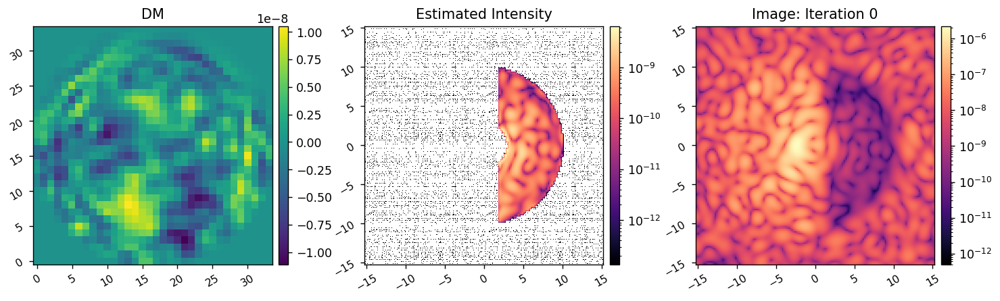

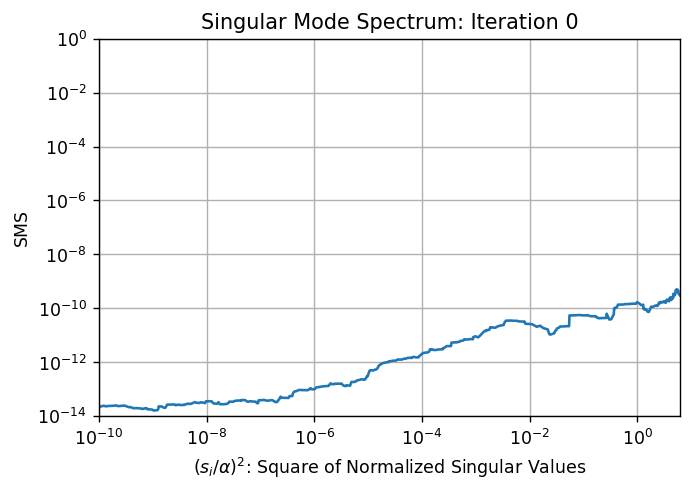

	Running iteration 1/10.
Estimation and exact image match factor is 0.744


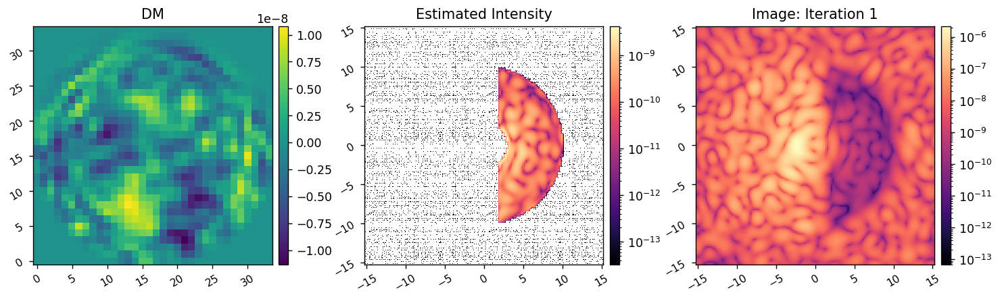

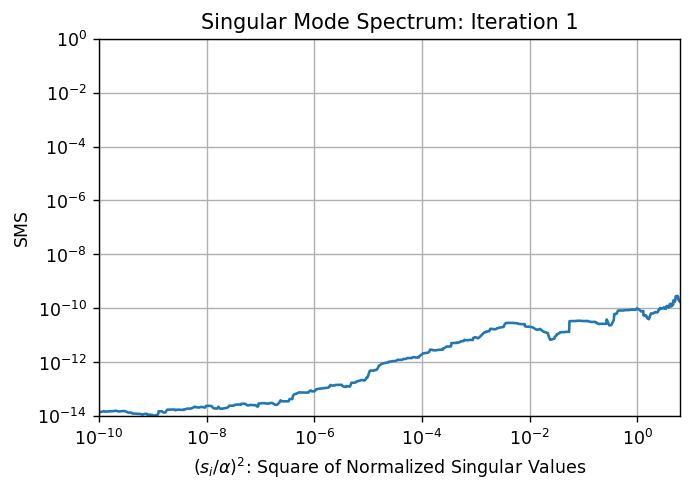

	Running iteration 2/10.
Estimation and exact image match factor is 0.636


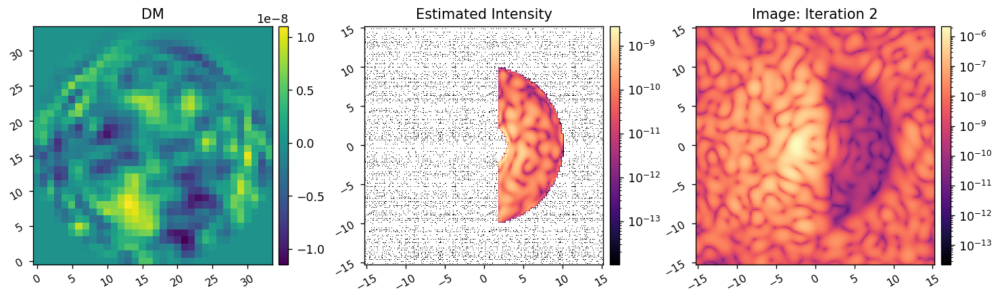

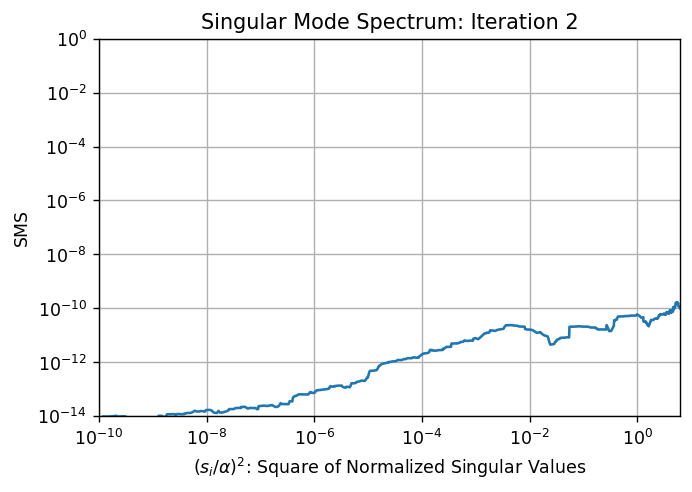

	Running iteration 3/10.
Estimation and exact image match factor is 0.520


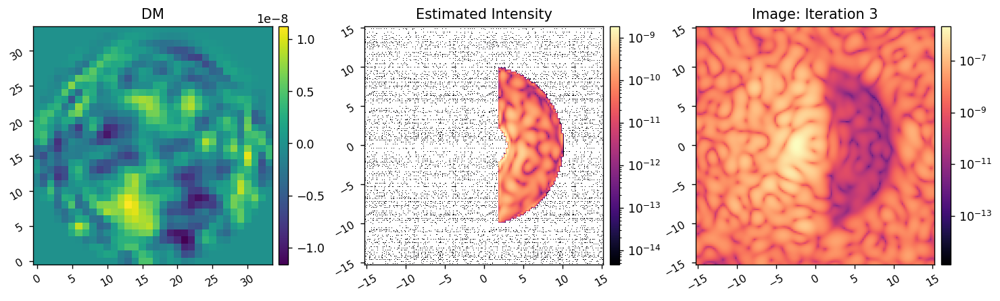

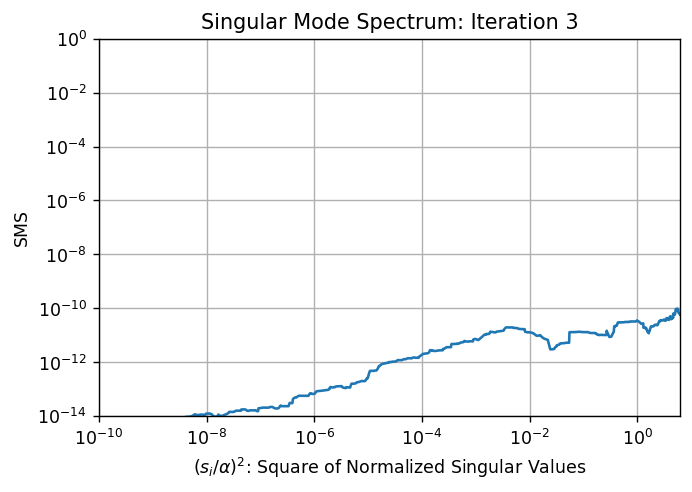

	Running iteration 4/10.
Estimation and exact image match factor is 0.409


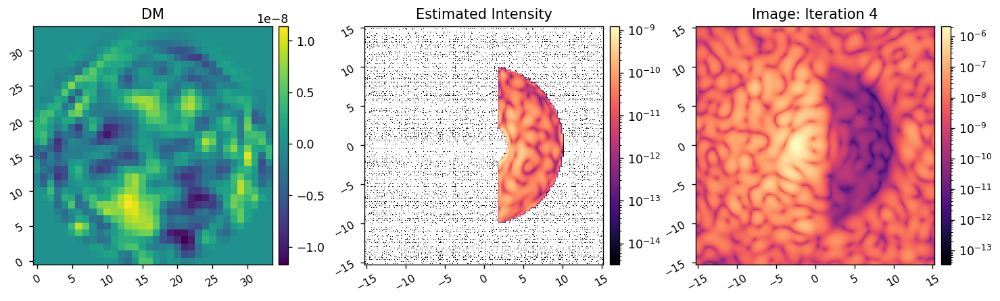

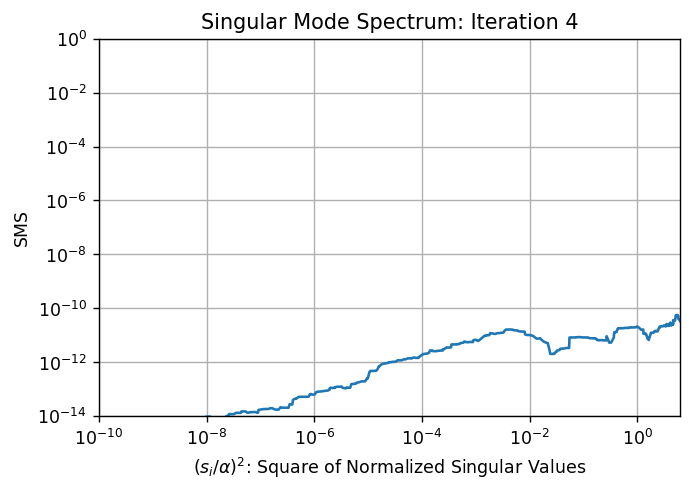

	Running iteration 5/10.
Estimation and exact image match factor is 0.312


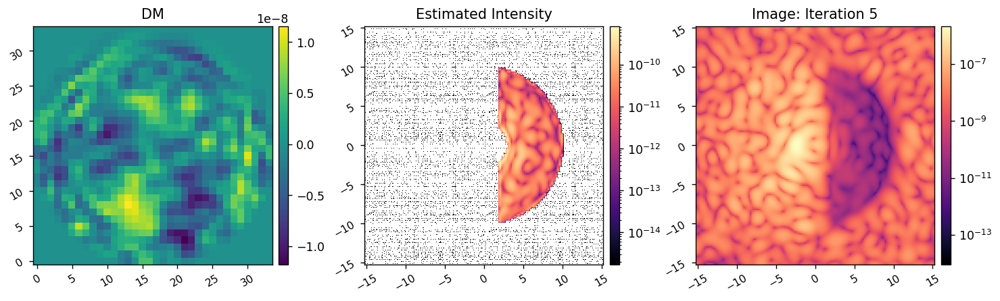

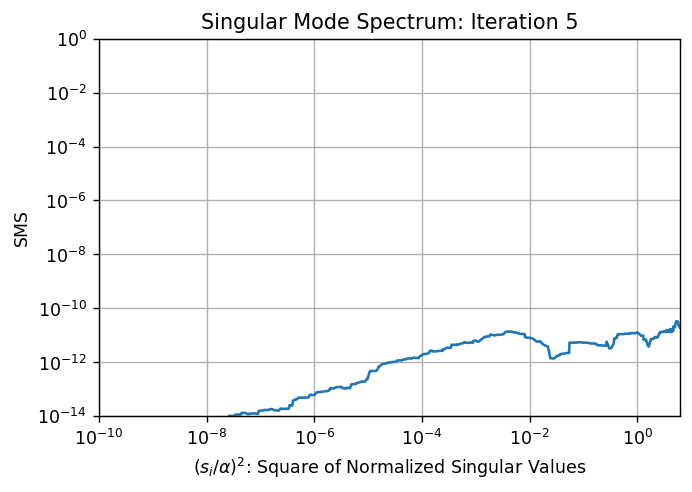

	Running iteration 6/10.
Estimation and exact image match factor is 0.234


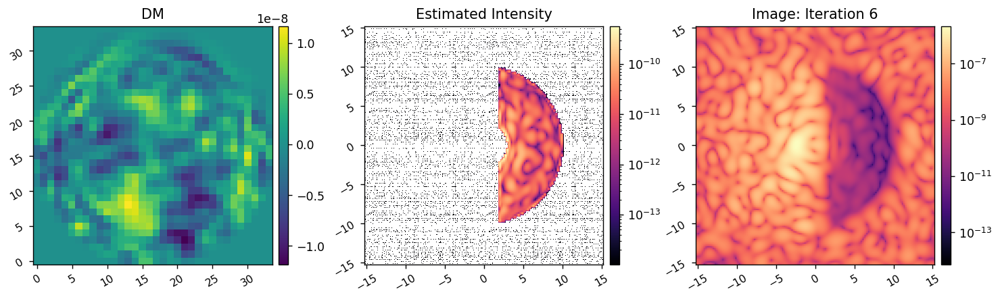

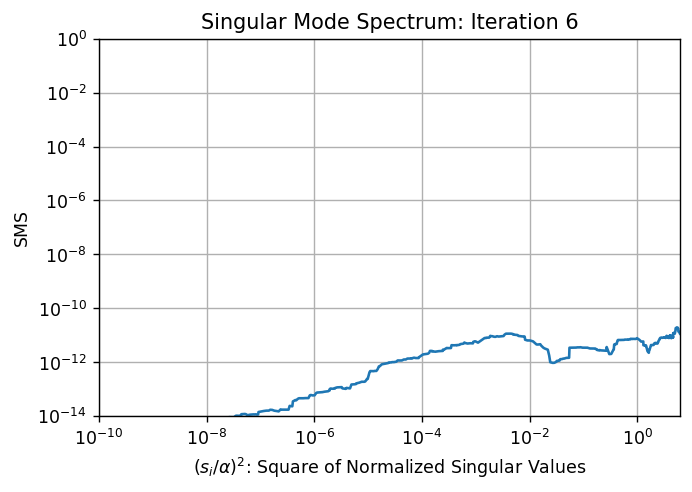

	Running iteration 7/10.
Estimation and exact image match factor is 0.175


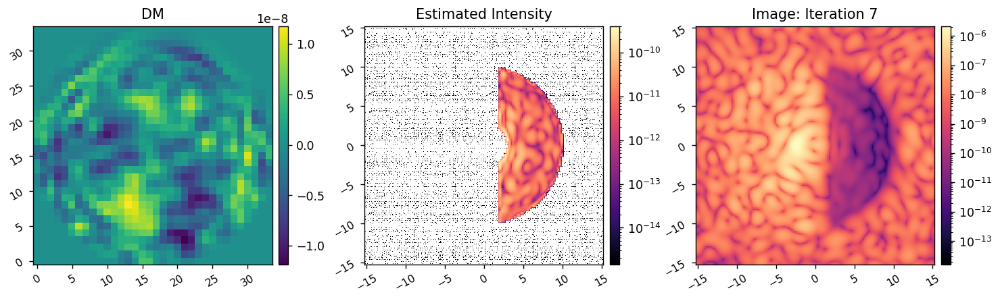

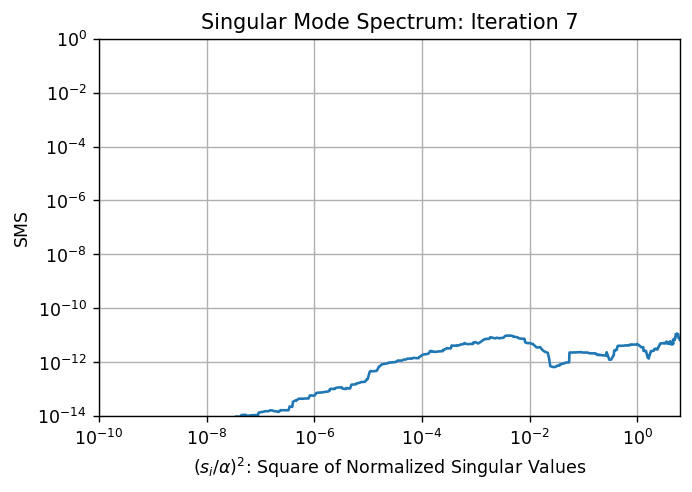

	Running iteration 8/10.
Estimation and exact image match factor is 0.132


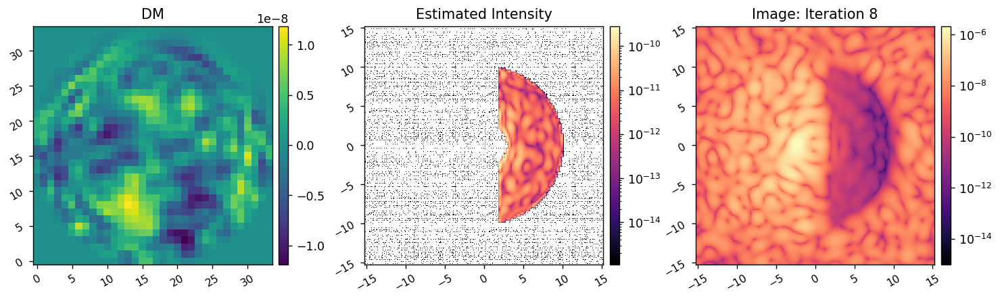

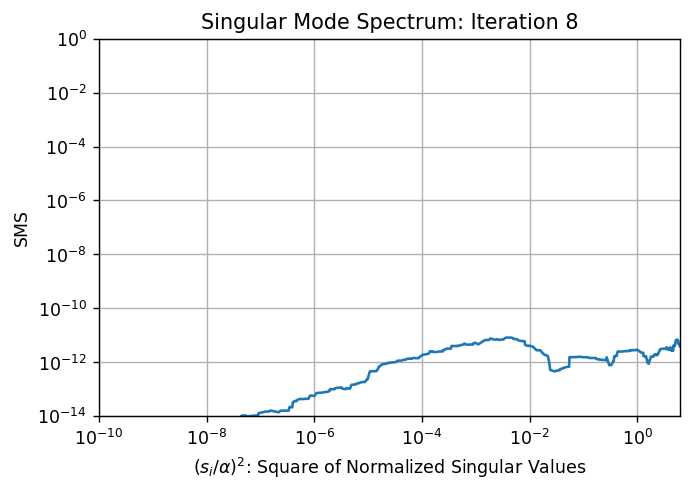

	Running iteration 9/10.
Estimation and exact image match factor is 0.102


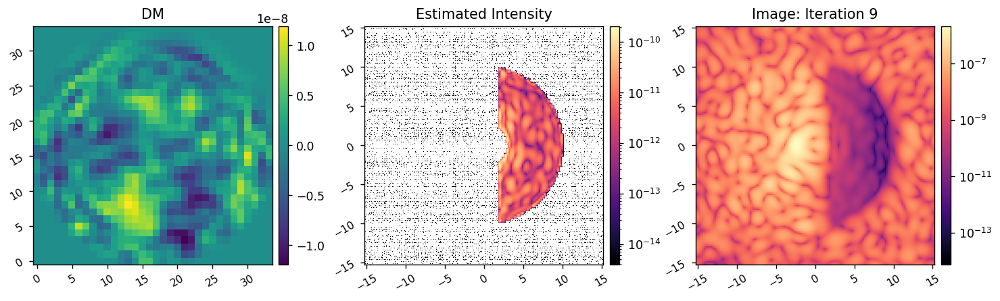

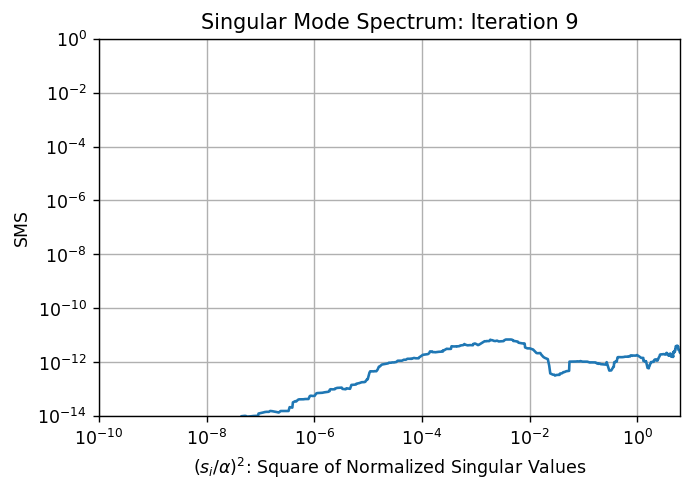

	Running iteration 10/10.
Estimation and exact image match factor is 0.081


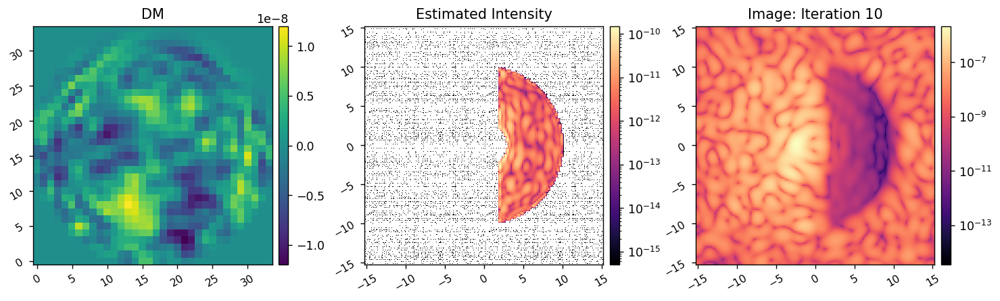

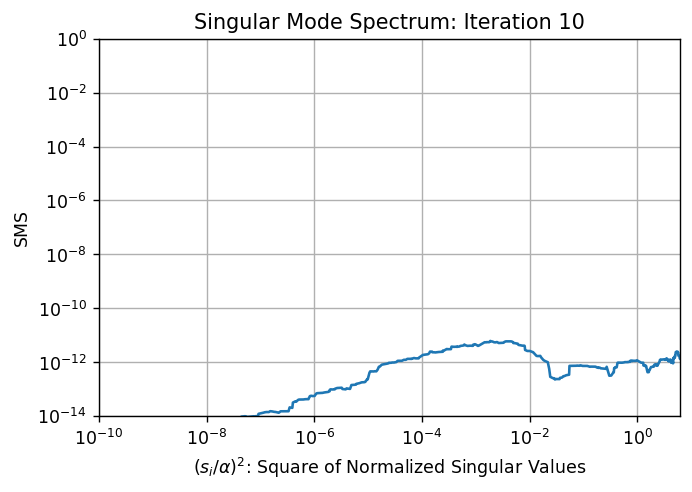

EFC completed in 41.395 sec.
Building Jacobian
Jacobian built in 156.767 sec
Jacobian (re)built in 156.776s.


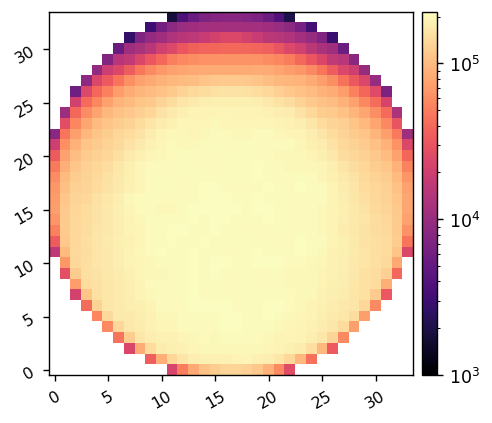

Beginning closed-loop EFC simulation.
Max singular value squared:	 284231896701.1263
alpha^2:			 46029905518.54014
	Running iteration 0/10.
	Computing EFC matrix via beta_reg with condition value -2.00e+00
Estimation and exact image match factor is 0.081


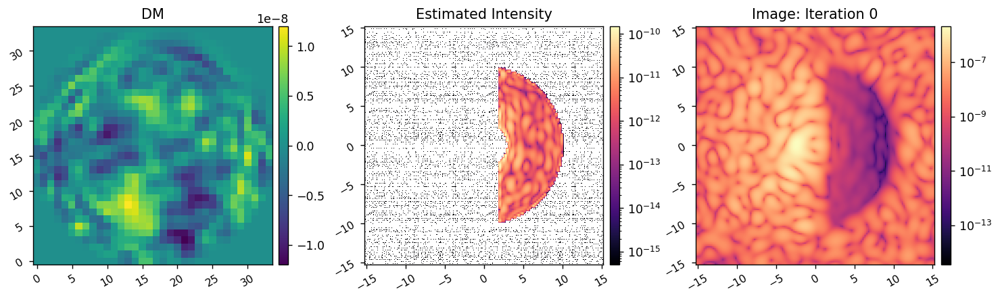

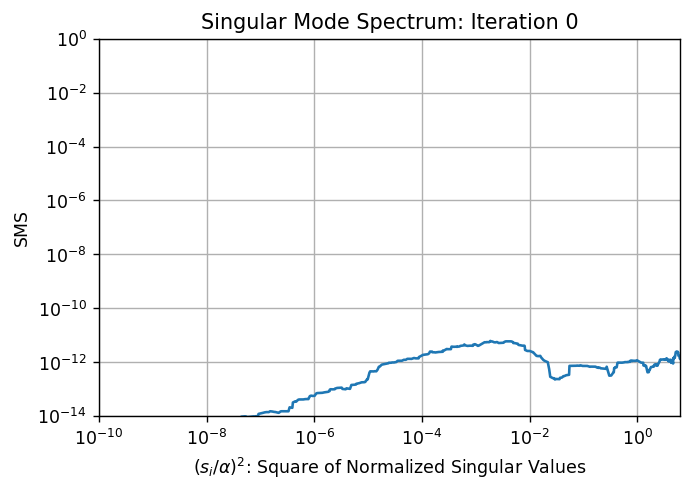

	Running iteration 1/10.
Estimation and exact image match factor is 0.067


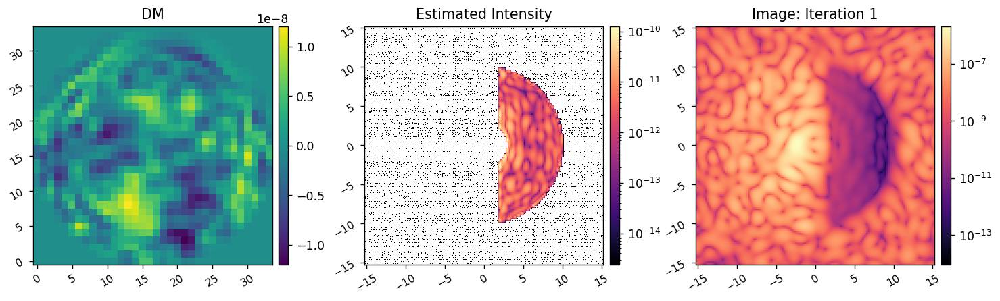

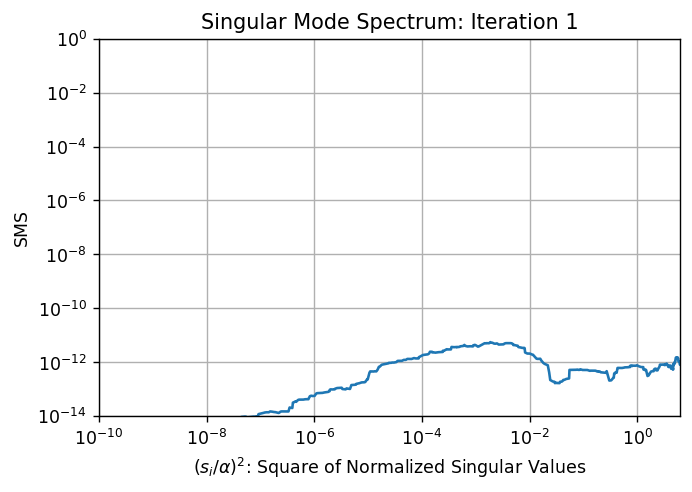

	Running iteration 2/10.
Estimation and exact image match factor is 0.057


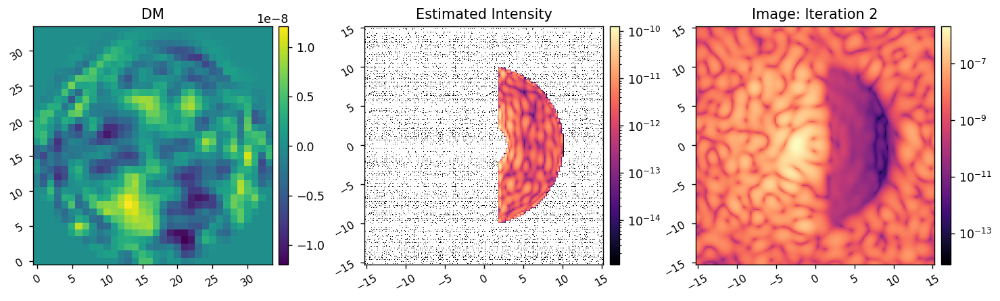

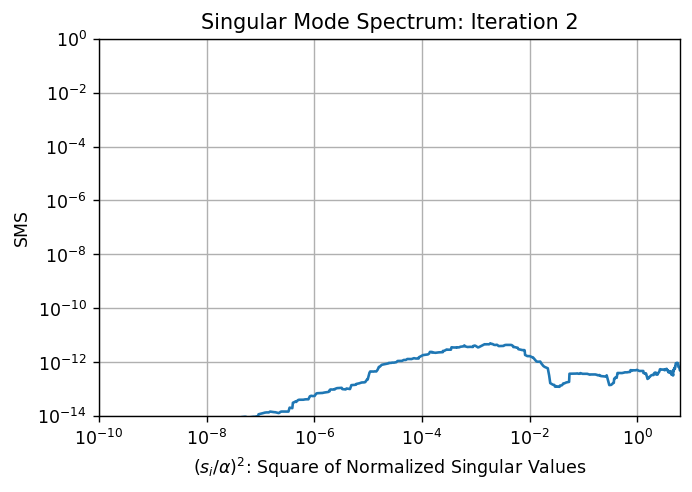

	Running iteration 3/10.
Estimation and exact image match factor is 0.050


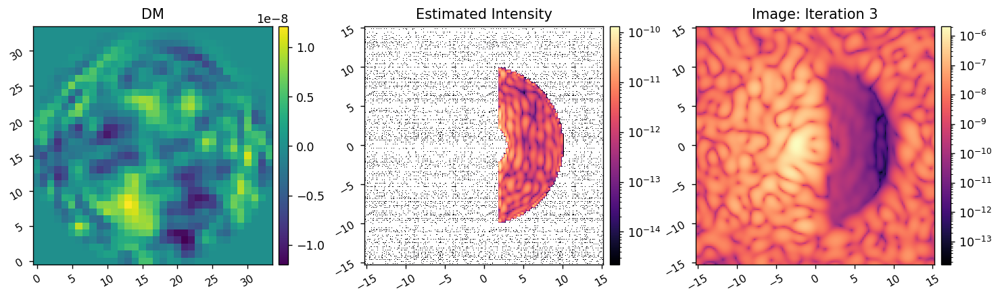

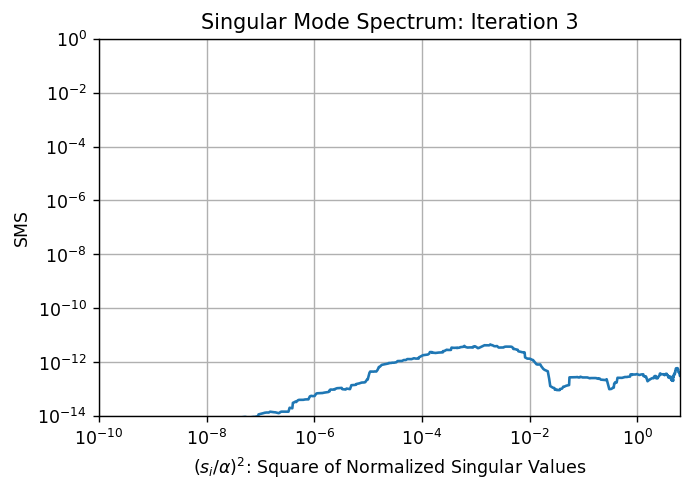

	Running iteration 4/10.
Estimation and exact image match factor is 0.045


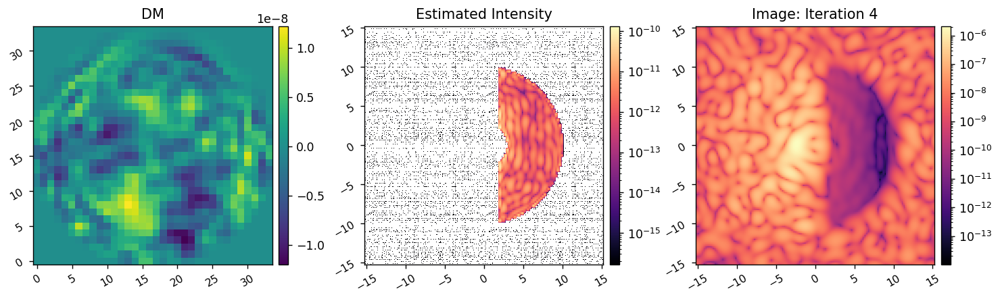

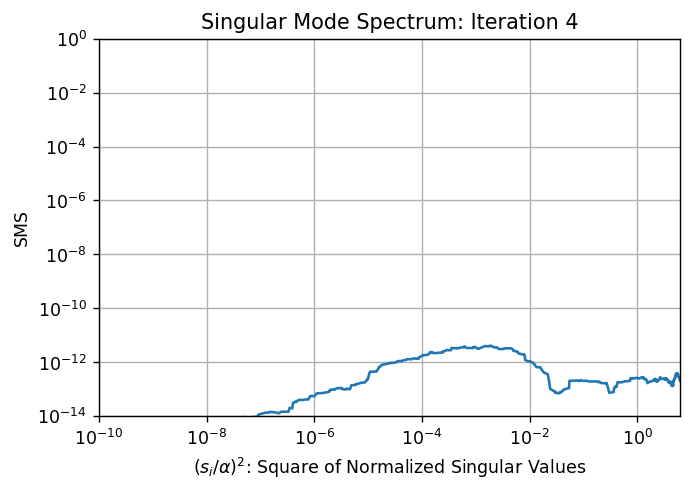

	Running iteration 5/10.
Estimation and exact image match factor is 0.041


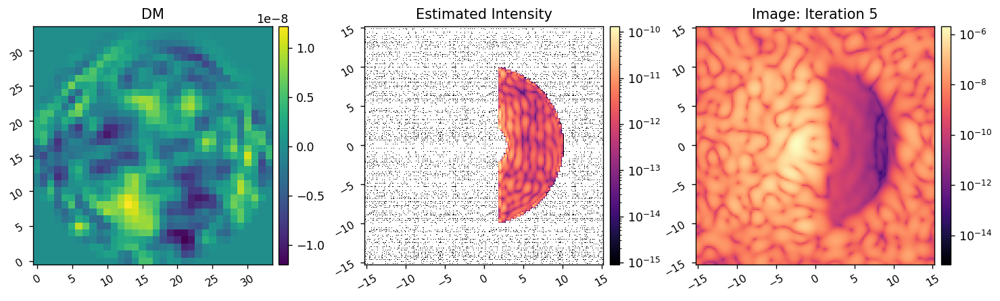

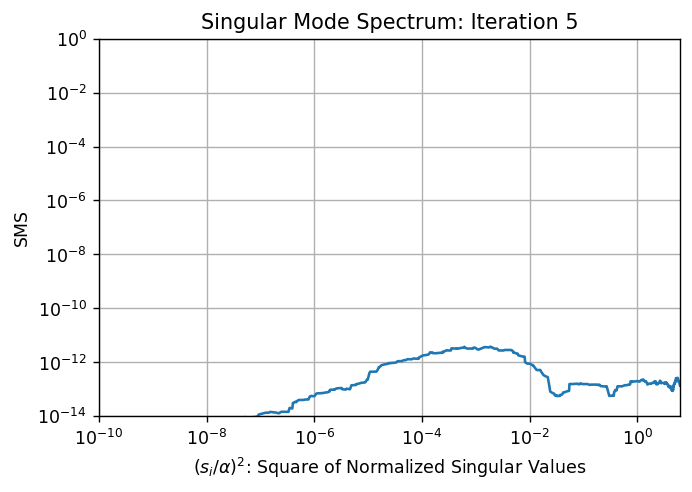

	Running iteration 6/10.
Estimation and exact image match factor is 0.038


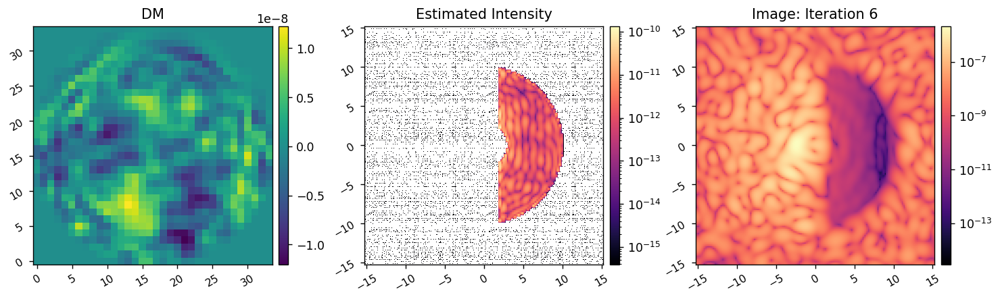

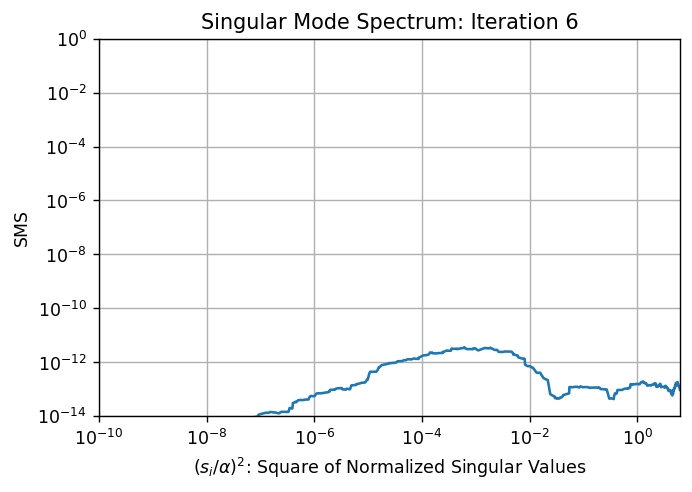

	Running iteration 7/10.
Estimation and exact image match factor is 0.036


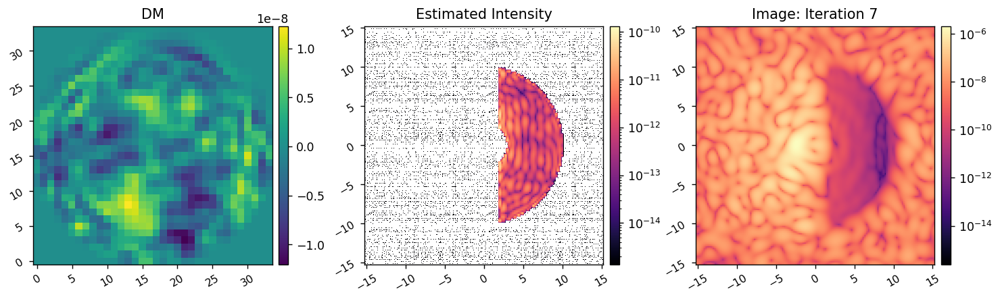

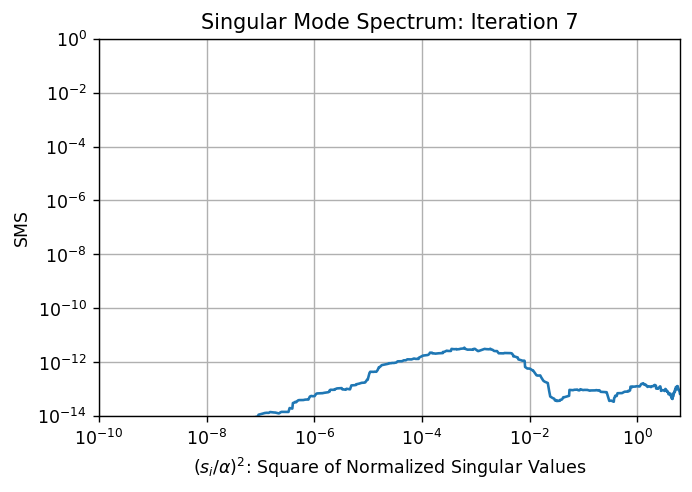

	Running iteration 8/10.
Estimation and exact image match factor is 0.034


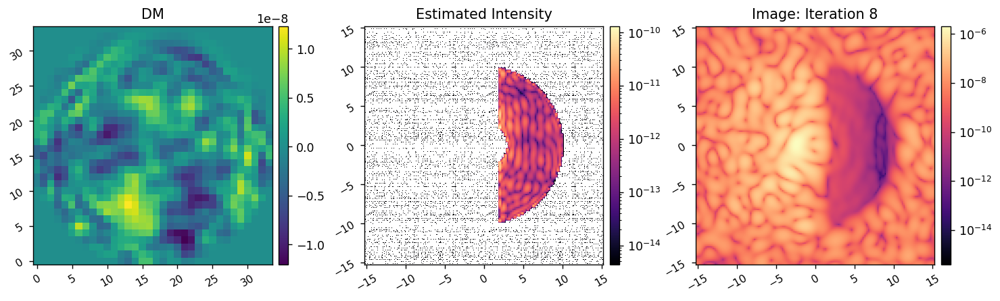

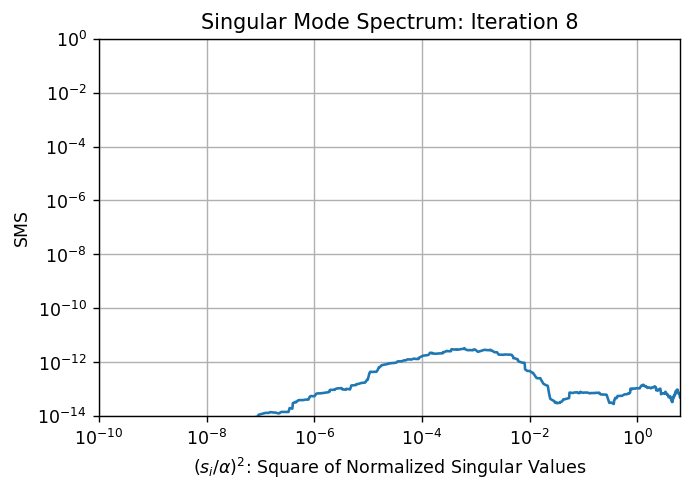

	Running iteration 9/10.
Estimation and exact image match factor is 0.033


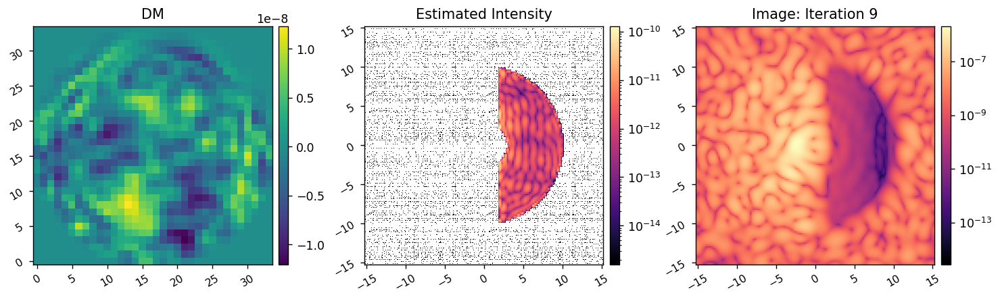

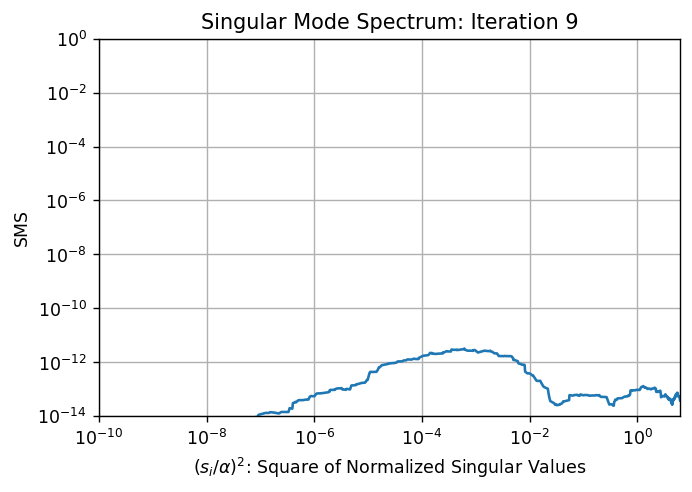

	Running iteration 10/10.
Estimation and exact image match factor is 0.031


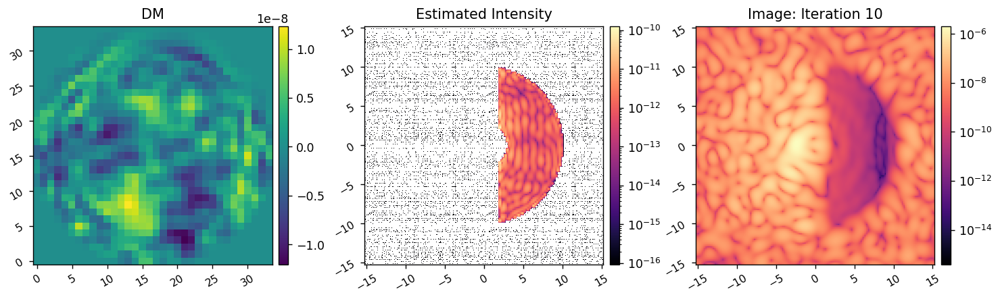

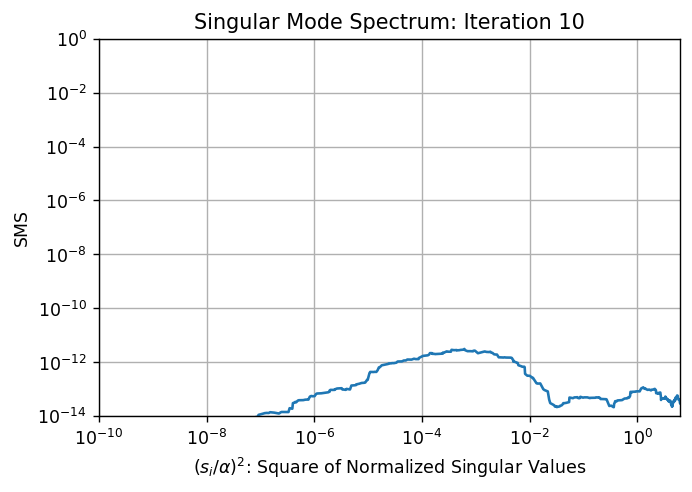

EFC completed in 38.894 sec.


In [13]:
reload(full)
reload(compact)
reload(efc)

cc.reset_dm()
fc.reset_dm()

epsilon = 1e-9 # poke amplitudes (DM surface)

dm_commands = []
ef_ests = []
images = []
for i in range(3):
    cc.set_dm(fc.get_dm()) # set the compact model to match the state of the full system
    
    print('Building Jacobian')
    start = time.time()
    jac = efc.build_jacobian(cc, epsilon, dark_mask.flatten(), display=False, print_status=False)
    response = utils.map_acts_to_dm(np.sqrt(((jac)**2).sum(axis=0)), cc.dm_mask)
    print('Jacobian (re)built in {:.3f}s.'.format(time.time()-start))
    misc.imshow1(response, lognorm=True, vmin=1e3)
    
    pwp_kwargs = {'probes':probes, 'use':'j', 'jacobian':jac/2, 
                  'display':False, 'display_probe_field':False}

    commands, efields, ims = efc.run_efc_pwp(fc,
                                                pwp_fun,
                                                pwp_kwargs,
                                                jac,
                                                reg_fun,
                                                reg_conds,
                                                dark_mask, 
                                                ref_im_unocc.max(),
                                                efc_loop_gain=0.5,
                                                iterations=10, 
                                                display_current=True, 
                                                display_all=True,
                                                plot_sms=True)
    dm_commands.append(commands)
    ef_ests.append(efields)
    images.append(ims)